In [1]:
import cv2
import pickle
from matplotlib import pyplot as plt
import numpy as np
import sys
import os

%matplotlib inline

In [1]:
#STEP2: train saliency predictor
import numpy as np
import pickle
import cv2
import imp

import torch as t
import torchvision as tv
import torchvision.transforms as transform
#from torch.utils.data import Dataset, DataLoader

import saliency_predictor
import header_headoren_salcorr as header
import header_saliency_ds as header_sal
imp.reload(header_sal)
imp.reload(header)

from matplotlib import pyplot as plt
%matplotlib inline

use_cuda = t.cuda.is_available()
device = t.device("cuda:0" if use_cuda else "cpu")
BATCH_SIZE = header_sal.BATCH_SIZE

class AddGaussianNoise(object):
    def __init__(self, mean=0., std=1., p=0.5):
        self.std = std
        self.mean = mean
        self.p = p
        
    def __call__(self, tensor):
        if np.random.rand() > self.p:
            return tensor
        return tensor + t.randn(tensor.size()) * self.std + self.mean
    
    def __repr__(self):
        return self.__class__.__name__ + '(mean={0}, std={1})'.format(self.mean, self.std)


In [2]:
resnet = tv.models.resnet101(pretrained=True)
saliency_predictor.modify_fc_layers(resnet)
resnet.to(device)
PATH = '../hmd-observe-video-prediction/models/panoresnet101_sal45x80merged_step002_expdistance_150'
resnet.load_state_dict(t.load(PATH, map_location=device))

<All keys matched successfully>

In [3]:
sal_ds_filepath = '../hmd-observe-video-prediction/data/pano-saliency-merge/ds_dcnn_expdistance_step0.2'
#sal_ds_filepath = '../hmd-observe-video-prediction/data/pano-saliency-merge/ds_dcnn_expdistance_full'
#sal_ds_filepath = './dataset/pano-saliency/ds_full'
tf5 =  transform.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
#tv.transforms.ColorJitter(brightness=0.3, contrast=0.2, saturation=0.2, hue=0.1)
transform_train = [tv.transforms.ToTensor(), tf5]
transform_test  = [tv.transforms.ToTensor(), tf5]
transform_gen   = [tv.transforms.ToTensor(), tf5]
transformed_dataset = saliency_predictor.PanoSalDataset(sal_ds_filepath, transform=tv.transforms.Compose(transform_train))
trainloader = t.utils.data.DataLoader(transformed_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)

In [9]:
ls .


0B7EVK8r0v71pTUZsaXdaSnZBZzg  Quaternion.py
create_dataset.ipynb          README.txt
data/                         saldat_head_orientation.py
Experiment_Distance.ipynb     saliency_dataset.py
header_headoren_salcorr.py    saliency_ds_lib.py
header_saliency_ds.py         saliency_predictor.py
headoren_sal_corr_helper.py   salnet_residual.ipynb
head_orientation_lib.py       spit_vid.ipynb
__init__.py                   testdata/
models/                       visualize_saliency.ipynb
__pycache__/


In [12]:
transform_inference  = [tv.transforms.Resize((144, 256)), tv.transforms.ToTensor(), tf5]

jyidat = tv.datasets.ImageFolder(root='./testdata/', transform=tv.transforms.Compose(transform_inference))
trainloader = t.utils.data.DataLoader(jyidat, batch_size=4, shuffle=False, num_workers=1)

torch.Size([4, 45, 80])


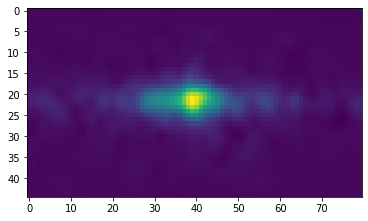

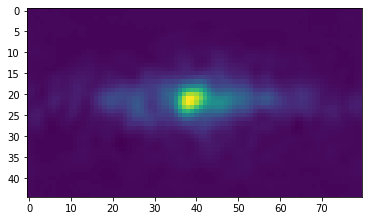

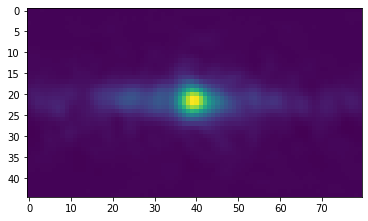

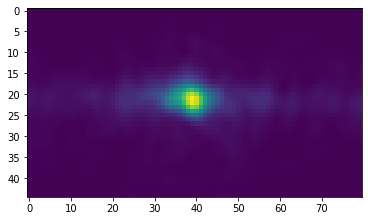

<Figure size 432x288 with 0 Axes>

In [31]:
def tensor2image(x):
    dat = x.squeeze().transpose(0, 2).transpose(0, 1)
    dat = (dat - dat.min())/(dat.max() - dat.min())
    return dat[:, :, :3]

with t.no_grad():
    for img_list, _ in trainloader:
        fx = resnet(img_list.to(device)).view(-1, header_sal.TARGET_SAL_H, header_sal.TARGET_SAL_W)
        break
print (fx.shape)
for idx, img in enumerate(fx):
    img = img.detach().cpu()
    plt.imshow(img)
    plt.imsave(f'./testdata/saliency_no_{idx}.png', img)
    plt.figure()

# for img_list, _ in trainloader:
#     print (img_list.shape)
#     plt.imshow(tensor2image(img_list[0]))
#     plt.figure()
#     if idx > 3:
#         break
#     fx = resnet(img.unsqueeze(0).to(device)).view(-1, header_sal.TARGET_SAL_H, header_sal.TARGET_SAL_W)
#     smap = fx[0].data.cpu().numpy()
#     plt.imshow(smap)
#     plt.imsave(f'./testdata/saliency_no_{idx}.png', smap)
#     plt.figure()

In [5]:
#dat = pickle.load(open('./dataset/pano-saliency/saliency_ds3_topicsport', 'rb'))
dat = pickle.load(open('../hmd-observe-video-prediction/data/pano-saliency/saliency_ds1_topicparis', 'rb'))

/home/anh2/anaconda2/envs/env_pytorch_python3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


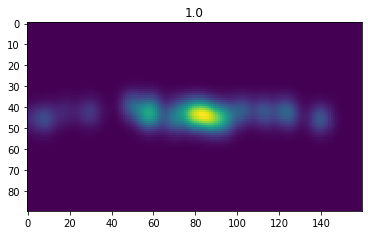

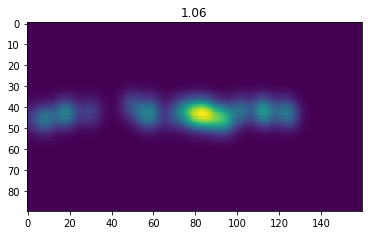

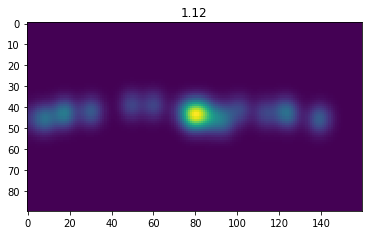

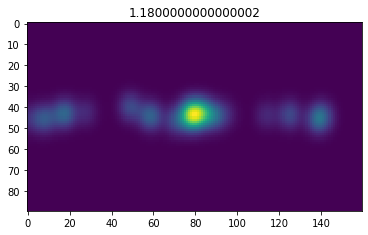

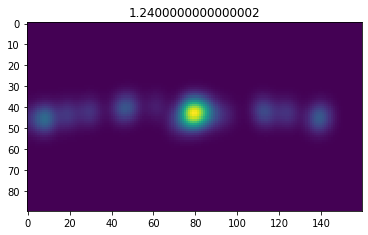

...

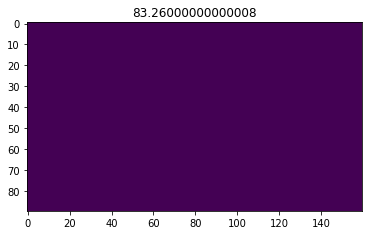

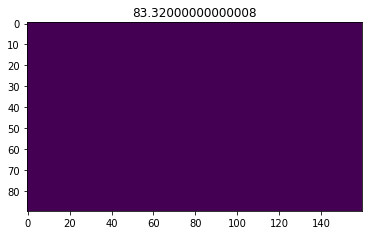

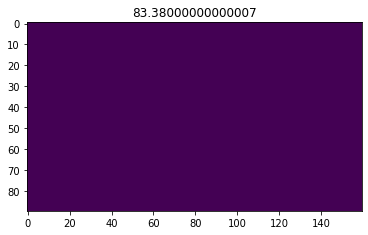

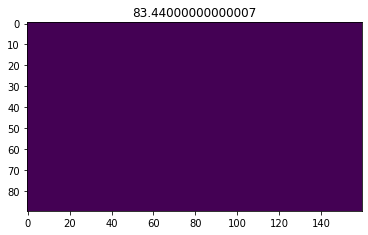

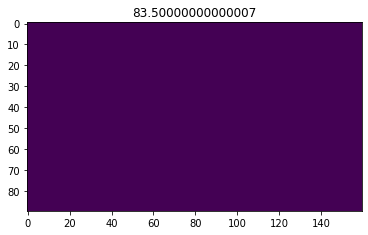

<Figure size 432x288 with 0 Axes>

In [6]:
for t, _, smap in dat:
    img = cv2.GaussianBlur(smap,(19,19),0)
    plt.imshow(img)
    plt.title(t)
    plt.figure()

In [ ]:
90 * 1.6, 160 * 1.6